In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(10,10)
plt.rcParams['figure.dpi']=300
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Company_Data.csv')
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [3]:
df.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,53.322500,13.900000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,16.200297,2.620528
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,25.000000,10.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,39.750000,12.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,54.500000,14.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,66.000000,16.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,80.000000,18.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [5]:
df.isnull().any()

Sales          False
CompPrice      False
Income         False
Advertising    False
Population     False
Price          False
ShelveLoc      False
Age            False
Education      False
Urban          False
US             False
dtype: bool

In [6]:
df.duplicated().sum()

0

In [8]:
df=pd.get_dummies(df,columns=['Urban','US'], drop_first=True)
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,Bad,42,17,1,1
1,11.22,111,48,16,260,83,Good,65,10,1,1
2,10.06,113,35,10,269,80,Medium,59,12,1,1
3,7.40,117,100,4,466,97,Medium,55,14,1,1
4,4.15,141,64,3,340,128,Bad,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,1,1
396,6.14,139,23,3,37,120,Medium,55,11,0,1
397,7.41,162,26,12,368,159,Medium,40,18,1,1
398,5.94,100,79,7,284,95,Bad,50,12,1,1


In [9]:
df['ShelveLoc']=df['ShelveLoc'].map({'Good':1,'Medium':2,'Bad':3})
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,3,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,3,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,1,33,14,1,1
396,6.14,139,23,3,37,120,2,55,11,0,1
397,7.41,162,26,12,368,159,2,40,18,1,1
398,5.94,100,79,7,284,95,3,50,12,1,1


In [10]:
sns.pairplot(data=df, hue = 'ShelveLoc')

<Axes: >

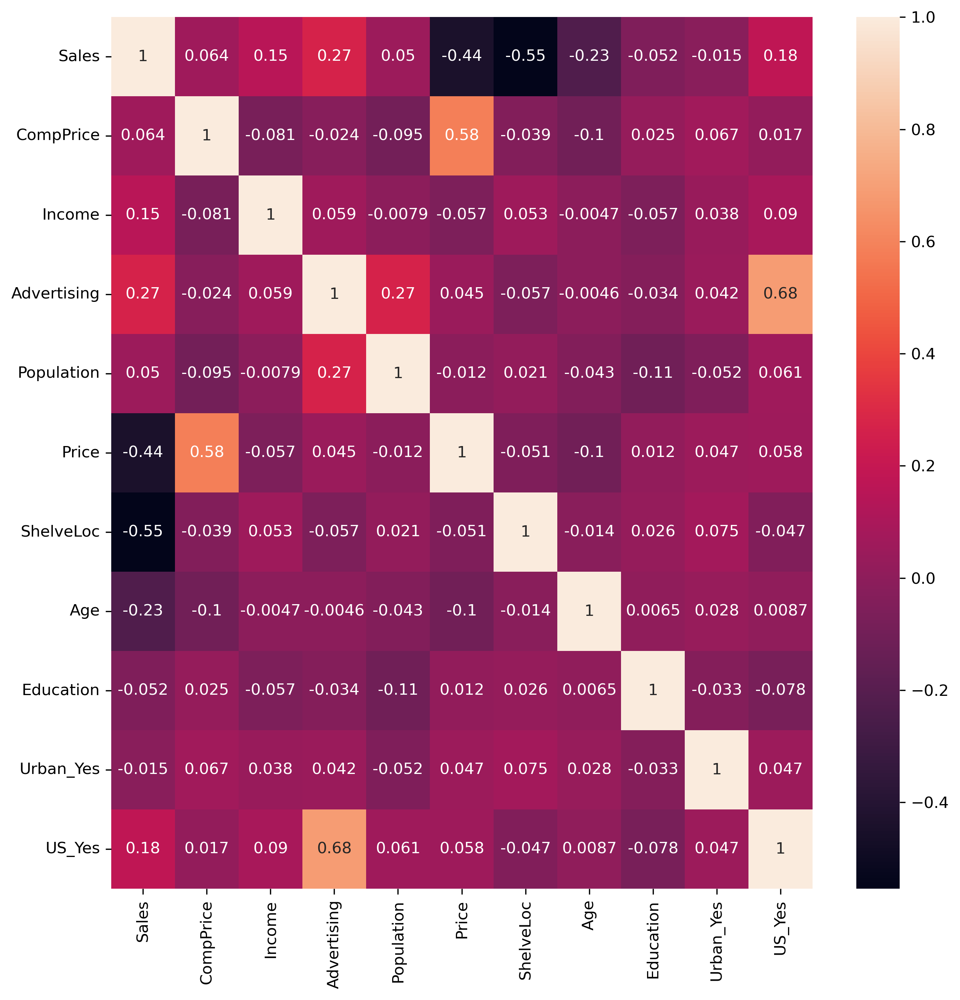

In [12]:
sns.heatmap(df.corr(),annot=True)

In [13]:
x=df.iloc[:,0:6]
y=df['ShelveLoc']
print(x)
y

     Sales  CompPrice  Income  Advertising  Population  Price
0     9.50        138      73           11         276    120
1    11.22        111      48           16         260     83
2    10.06        113      35           10         269     80
3     7.40        117     100            4         466     97
4     4.15        141      64            3         340    128
..     ...        ...     ...          ...         ...    ...
395  12.57        138     108           17         203    128
396   6.14        139      23            3          37    120
397   7.41        162      26           12         368    159
398   5.94        100      79            7         284     95
399   9.71        134      37            0          27    120

[400 rows x 6 columns]


0      3
1      1
2      2
3      2
4      3
      ..
395    1
396    2
397    2
398    3
399    1
Name: ShelveLoc, Length: 400, dtype: int64

In [14]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,random_state=1)

In [15]:
dt= DecisionTreeClassifier(criterion = 'entropy',max_depth=3)
dt.fit(xtrain,ytrain)
ypred=dt.predict(xtest)
pd.Series(ypred).value_counts()

2    52
3    18
1    10
dtype: int64

In [16]:
ypred

array([2, 2, 3, 1, 2, 2, 3, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 1, 3, 3, 2, 3,
       3, 3, 1, 3, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 1, 2, 2, 1, 3,
       2, 2, 2, 2, 2, 2, 3, 2, 1, 1, 2, 2, 1, 2, 3, 2, 2, 2, 2, 2, 3, 2,
       3, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 3, 2, 3], dtype=int64)

In [17]:
from sklearn.metrics import classification_report

In [18]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.60      0.40      0.48        15
           2       0.58      0.67      0.62        45
           3       0.33      0.30      0.32        20

    accuracy                           0.53        80
   macro avg       0.50      0.46      0.47        80
weighted avg       0.52      0.53      0.52        80



In [19]:
print('Training Acurracy:', dt.score(xtrain,ytrain))
print('Testing Acurracy:',dt.score(xtest,ytest))

Training Acurracy: 0.684375
Testing Acurracy: 0.525


Training Acurracy: 0.684375
Testing Acurracy: 0.525

# There is much difference b/w training and testing accuracy
It should not be more than 3%

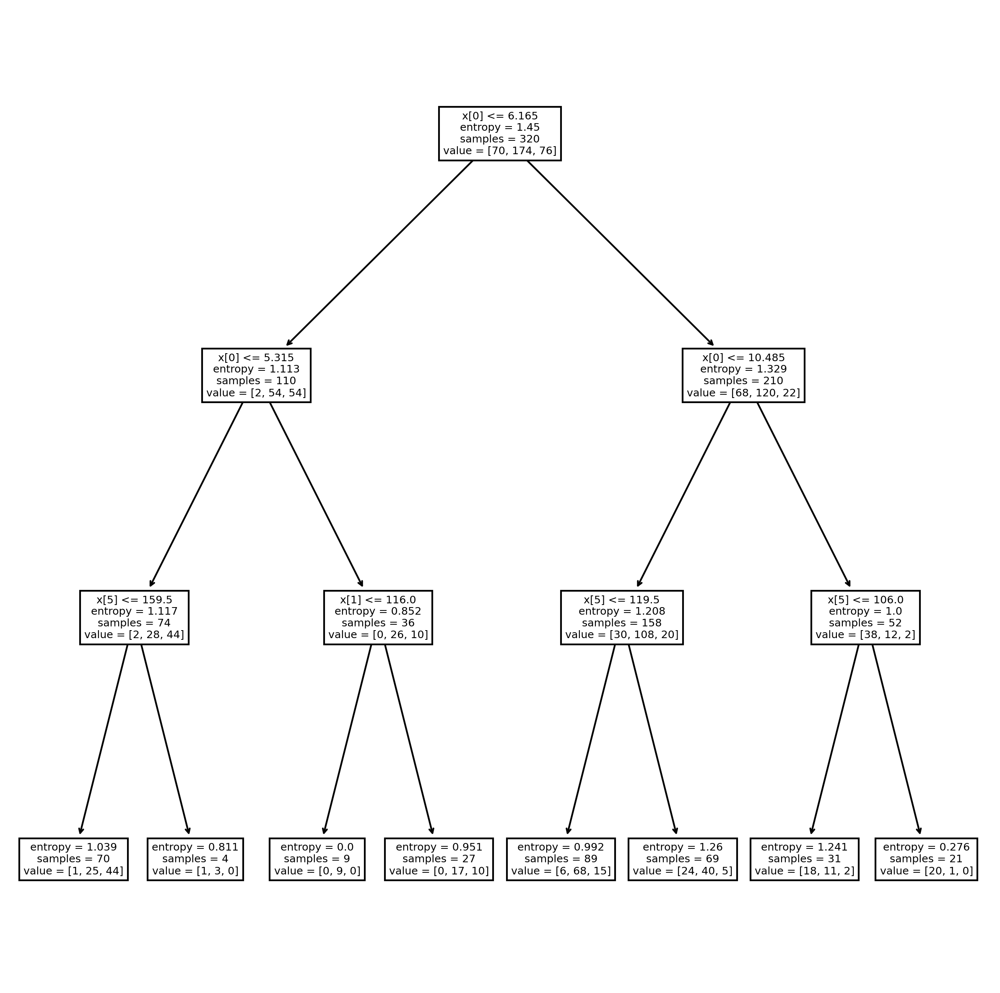

In [20]:
tree.plot_tree(dt)
plt.show()

In [21]:
x.columns

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price'], dtype='object')

In [22]:
df['ShelveLoc'].unique()

array([3, 1, 2], dtype=int64)

In [23]:
print(x.columns)
dt.feature_importances_

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price'], dtype='object')


array([0.75502836, 0.03506897, 0.        , 0.        , 0.        ,
       0.20990268])

#   Building Decision Tree Classifier (CART) using Gini Criteria

In [24]:
dtc=DecisionTreeClassifier(criterion='gini')

In [25]:
dtc.fit(xtrain,ytrain)

DecisionTreeClassifier()

In [26]:
ypred=dtc.predict(xtest)

In [27]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.64      0.60      0.62        15
           2       0.57      0.64      0.60        45
           3       0.27      0.20      0.23        20

    accuracy                           0.53        80
   macro avg       0.49      0.48      0.48        80
weighted avg       0.51      0.53      0.51        80



In [28]:
dtc.score(xtrain,ytrain),dtc.score(xtest,ytest)

(1.0, 0.525)

# Decision Tree Regression 

In [29]:
from sklearn.tree import DecisionTreeRegressor

In [30]:
dtr=DecisionTreeRegressor()

In [31]:
dtr.fit(xtrain,ytrain)

DecisionTreeRegressor()

In [32]:
yp=dtr.predict(xtest)
yp

array([2., 2., 3., 1., 3., 3., 3., 2., 2., 2., 2., 2., 2., 3., 1., 2., 2.,
       2., 2., 3., 2., 2., 3., 2., 1., 3., 2., 2., 2., 2., 2., 3., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 1., 3., 2., 1., 2., 3., 1., 2., 2.,
       3., 1., 1., 2., 2., 1., 2., 3., 1., 3., 3., 3., 2., 2., 2., 3., 1.,
       1., 1., 3., 2., 2., 2., 1., 2., 2., 3., 2., 3.])

In [33]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)

(1.0, -0.23963963963963963)

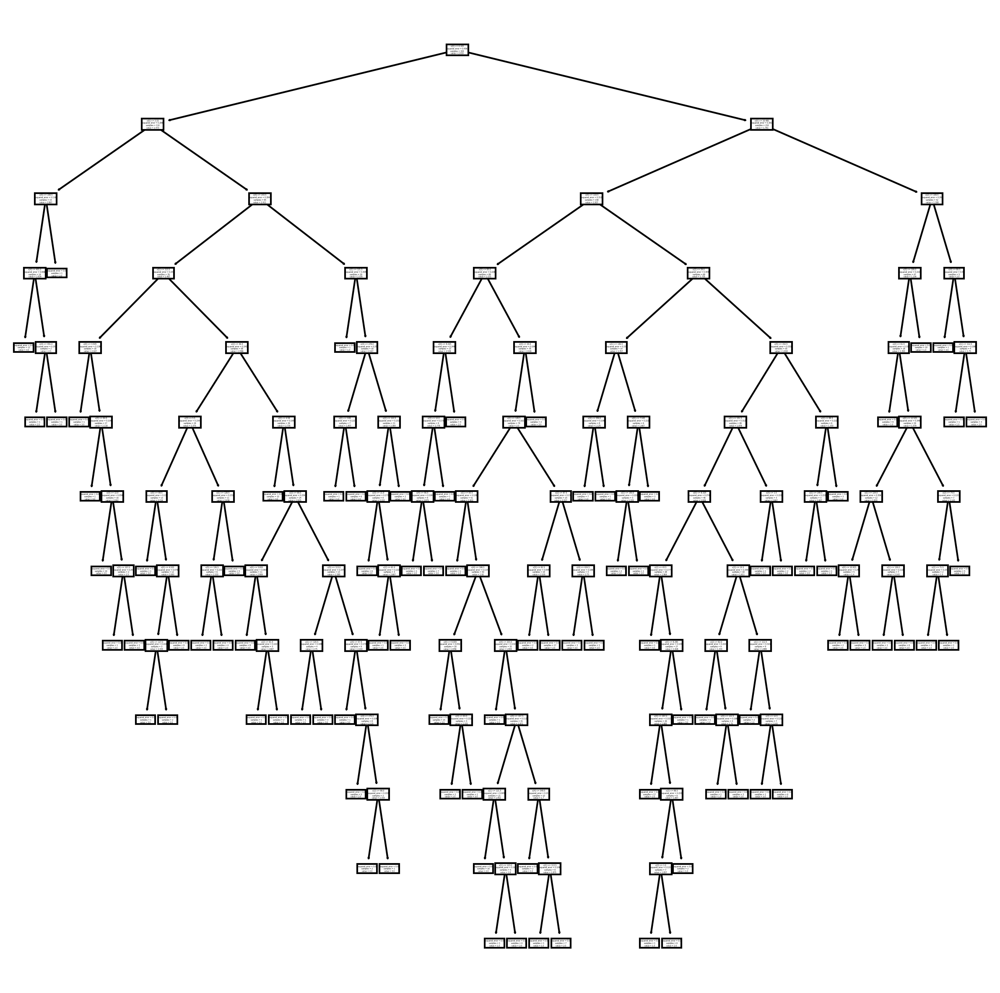

In [34]:
tree.plot_tree(dtr)
plt.show()


# HyperParameter tuning

In [35]:
from sklearn.model_selection import GridSearchCV

In [36]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [37]:
params={
    'criterion':['squared_error','absolute_error'],
    'max_depth':[3,6,7,8,9,11],
    'splitter':['best','random']
}

In [38]:
grid=GridSearchCV(estimator=DecisionTreeRegressor(),param_grid=params,verbose=1)

In [39]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [3, 6, 7, 8, 9, 11],
                         'splitter': ['best', 'random']},
             verbose=1)

In [40]:
grid.best_params_

{'criterion': 'squared_error', 'max_depth': 3, 'splitter': 'random'}

In [41]:
hdtr=DecisionTreeRegressor(criterion='squared_error',max_depth=3,splitter='random')

In [42]:
hdtr.fit(xtrain,ytrain)

DecisionTreeRegressor(max_depth=3, splitter='random')

In [43]:
hyp=hdtr.predict(xtest)

In [44]:
hdtr.score(xtrain,ytrain),hdtr.score(xtest,ytest)

(0.2225688212674557, -0.006869793812228631)

In [45]:
print('Training Acurracy:', hdtr.score(xtrain,ytrain))
print('Testing Acurracy:',hdtr.score(xtest,ytest))

Training Acurracy: 0.2225688212674557
Testing Acurracy: -0.006869793812228631
